<a href="https://colab.research.google.com/github/coderzaman/Data-Analysis-Notebooks/blob/main/automated_plant_disease_ditection_using_deep_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Library

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import cv2 as cv
import numpy as np
import plotly.express as px
import math
np.random.seed(42)
import tensorflow as tf
tf.random.set_seed(42)
import random
random.seed(42)

from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, BatchNormalization, ReLU, MaxPooling2D, Dropout, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau , ModelCheckpoint
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

# Laod File

In [ ]:
base_dir="/kaggle/input/plantvillage-dataset/color"
#/kaggle/input/plantvillage-dataset/color/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG
folds=os.listdir(base_dir)
print(folds)

filepaths=[]
labels=[]
for fold in folds:
    folder_path=os.path.join(base_dir,fold)
    # print(folder_path)
    imgs=os.listdir(folder_path)
    for img in imgs:
        img_path=os.path.join(folder_path,img)
        filepaths.append(img_path)
        labels.append(fold)
print("Total images:", len(filepaths))
print("Total labels:", len(labels))

['Tomato___Late_blight', 'Tomato___healthy', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Potato___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Early_blight', 'Tomato___Septoria_leaf_spot', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Strawberry___Leaf_scorch', 'Peach___healthy', 'Apple___Apple_scab', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Bacterial_spot', 'Apple___Black_rot', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Peach___Bacterial_spot', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Pepper,_bell___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Potato___Late_blight', 'Tomato___Tomato_mosaic_virus', 'Strawberry___healthy', 'Apple___healthy', 'Grape___Black_rot', 'Potato___Early_blight', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Common_rust_', 'Grape___Esca_(Black_Measles)', 'Raspberry___healthy', 'Tomato___Leaf_Mold', 'Tomato__

# Exploratory data analysis

In [ ]:
data_df=pd.Series(filepaths,name='filepaths')
label_df=pd.Series(labels,name='labels')
data=pd.concat([data_df,label_df],axis=1)

In [ ]:
data.labels.value_counts()

labels
Orange___Haunglongbing_(Citrus_greening)              5507
Tomato___Tomato_Yellow_Leaf_Curl_Virus                5357
Soybean___healthy                                     5090
Peach___Bacterial_spot                                2297
Tomato___Bacterial_spot                               2127
Tomato___Late_blight                                  1909
Squash___Powdery_mildew                               1835
Tomato___Septoria_leaf_spot                           1771
Tomato___Spider_mites Two-spotted_spider_mite         1676
Apple___healthy                                       1645
Tomato___healthy                                      1591
Blueberry___healthy                                   1502
Pepper,_bell___healthy                                1478
Tomato___Target_Spot                                  1404
Grape___Esca_(Black_Measles)                          1383
Corn_(maize)___Common_rust_                           1192
Grape___Black_rot                                

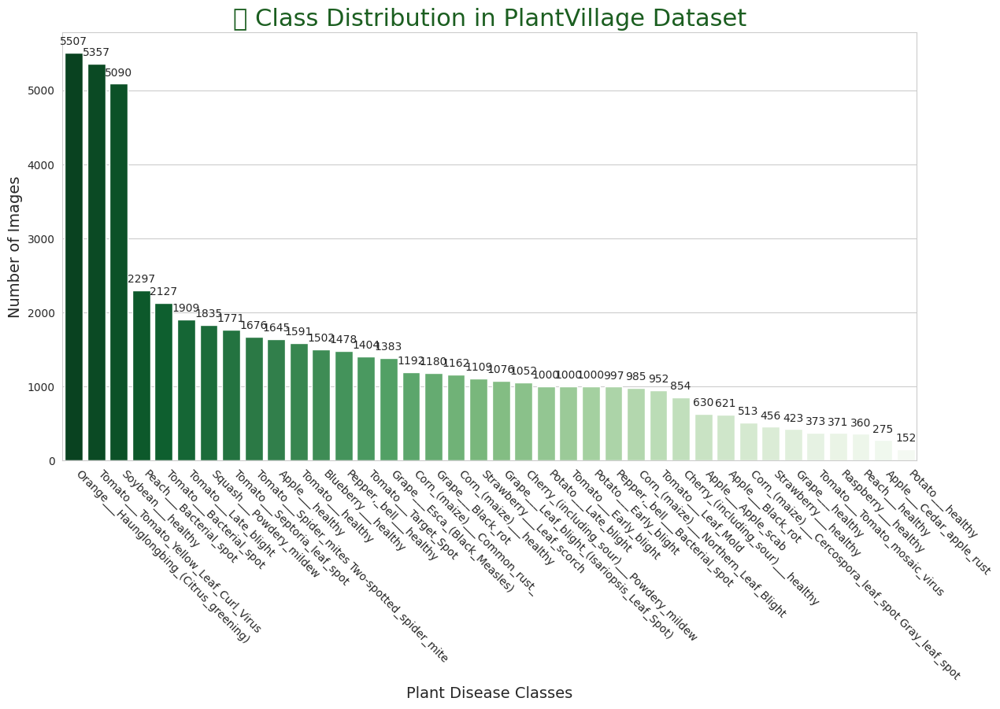

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Data Preparation ---
# Calculate the count of each unique label and prepare the DataFrame for plotting
label_counts = data.labels.value_counts().reset_index()
label_counts.columns = ['Label', 'Count']

# --- Seaborn Plot Generation ---
# Set the figure size for better visualization of many classes
plt.figure(figsize=(14, 8))

# Create the Seaborn bar plot
# 'palette' is used to set the color scheme, similar to 'color_continuous_scale' in Plotly
ax = sns.barplot(
    x='Label',
    y='Count',
    data=label_counts,
    palette='Greens_r' # Use a reverse Green palette for deeper color at the bottom
)

# --- Styling and Layout Updates (Matplotlib equivalent to fig.update_layout) ---

# Set the title with specified font size, color, and family
ax.set_title('🌿 Class Distribution in PlantVillage Dataset',
             fontsize=22,
             color='#1b5e20')

# Set axis labels
ax.set_xlabel("Plant Disease Classes", fontsize=14)
ax.set_ylabel("Number of Images", fontsize=14)

# Rotate x-axis labels by -45 degrees (equivalent to xaxis_tickangle=-45)
plt.xticks(rotation=-45, ha='left')
# Adjust the bottom margin to prevent labels from being cut off
plt.subplots_adjust(bottom=0.2)

# Use a white background theme, similar to Plotly's 'plotly_white'
sns.set_style('whitegrid')
# Alternatively, to remove grid lines: sns.set_style('white')

# --- Add Numerical Labels (Equivalent to fig.update_traces(text=..., textposition='outside')) ---
# Iterate over the bars (patches) and add the count label on top of each
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', # The text to display (the height/count)
                # Position the text slightly above the bar center
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center',
                va='center',
                xytext=(0, 10), # Offset (x, y) coordinates from the bar's top center
                textcoords='offset points')

# Display the plot
plt.show()

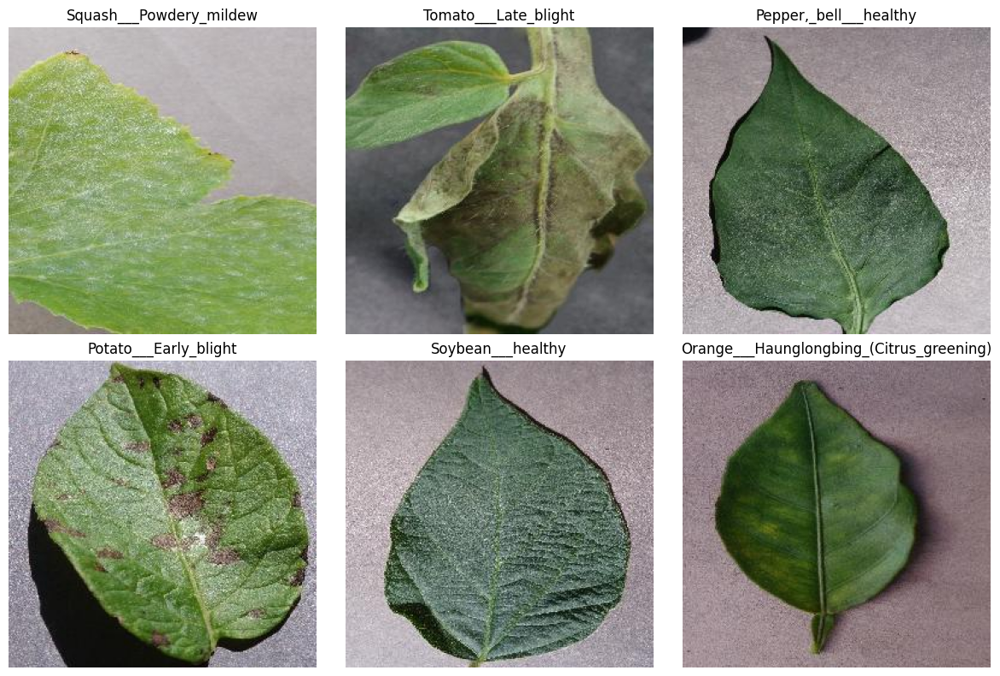

In [ ]:
plt.figure(figsize=(12,8))
for i in range(6):
    plt.subplot(2,3,i+1)
    rand_idx = np.random.randint(0, len(data))
    img_path = data.iloc[rand_idx]['filepaths']
    lbl = data.iloc[rand_idx]['labels']
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.title(lbl)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Split Data into Train, Validation, and Test Sets

In [ ]:
train_data, temp_data = train_test_split(data, test_size=0.2, shuffle=True, stratify=data['labels'], random_state=42)
valid_data, test_data = train_test_split(temp_data, test_size=0.5, shuffle=True, stratify=temp_data['labels'], random_state=42)

In [ ]:
print(len(train_data.labels.value_counts()))
print(len(test_data.labels.value_counts()))
print(len(valid_data.labels.value_counts()))

38
38
38


In [ ]:
image_size = 224
batch_size = 32
channel = 3

### **Data Augmentation and Normalization**

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')
test_datagen=ImageDataGenerator(rescale=1./255,)

In [ ]:
train_gen=train_datagen.flow_from_dataframe(
    dataframe=train_data,
    x_col='filepaths',
    y_col='labels',
    batch_size=batch_size,
    class_mode='categorical',
    target_size=(image_size,image_size),
    shuffle=True

)

Found 43444 validated image filenames belonging to 38 classes.


In [ ]:
test_gen=test_datagen.flow_from_dataframe(
    dataframe=test_data,
    x_col='filepaths',
    y_col='labels',
    batch_size=batch_size,
    class_mode='categorical',
    target_size=(image_size,image_size),
    shuffle=False

)

Found 5431 validated image filenames belonging to 38 classes.


In [ ]:
valid_gen=test_datagen.flow_from_dataframe(
    dataframe=valid_data,
    x_col='filepaths',
    y_col='labels',
    class_mode='categorical',
    batch_size=batch_size,
    target_size=(image_size,image_size),
    shuffle=False

)

Found 5430 validated image filenames belonging to 38 classes.


In [ ]:
print("--- Class names and their integer labels ---")

for class_name, class_index in train_gen.class_indices.items():
    print(f"Class Label: '{class_name}' -> {class_index}")

print("\n---Iteration completed.---")

--- Class names and their integer labels ---
Class Label: 'Apple___Apple_scab' -> 0
Class Label: 'Apple___Black_rot' -> 1
Class Label: 'Apple___Cedar_apple_rust' -> 2
Class Label: 'Apple___healthy' -> 3
Class Label: 'Blueberry___healthy' -> 4
Class Label: 'Cherry_(including_sour)___Powdery_mildew' -> 5
Class Label: 'Cherry_(including_sour)___healthy' -> 6
Class Label: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot' -> 7
Class Label: 'Corn_(maize)___Common_rust_' -> 8
Class Label: 'Corn_(maize)___Northern_Leaf_Blight' -> 9
Class Label: 'Corn_(maize)___healthy' -> 10
Class Label: 'Grape___Black_rot' -> 11
Class Label: 'Grape___Esca_(Black_Measles)' -> 12
Class Label: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)' -> 13
Class Label: 'Grape___healthy' -> 14
Class Label: 'Orange___Haunglongbing_(Citrus_greening)' -> 15
Class Label: 'Peach___Bacterial_spot' -> 16
Class Label: 'Peach___healthy' -> 17
Class Label: 'Pepper,_bell___Bacterial_spot' -> 18
Class Label: 'Pepper,_bell___healthy' -

# Model Build and Train

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
from tensorflow.keras.optimizers import Adam


NUM_CLASSES = len(train_gen.class_indices)



model = Sequential([
    # Input layer
    layers.InputLayer(input_shape=(image_size, image_size, channel)),

    # --- Convolutional Block 1 ---
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Dropout(0.25), # ড্রপআউট রেট

    # --- Convolutional Block 2 ---
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # --- Convolutional Block 3 ---
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(256, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Dropout(0.3),

    # --- Classification Head ---
    Flatten(),

    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),

    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.4),

    # Output layer
    Dense(NUM_CLASSES, activation='softmax')
])

model.summary()



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 224, 224, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 224, 224, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 112, 112, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 56, 56, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 200704)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │   102,760,960 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 103,480,742 (394.75 MB)

 Trainable params: 103,477,862 (394.74 MB)

 Non-trainable params: 2,880 (11.25 KB)

In [ ]:
print("\n--- Compiling the model ---")
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


--- Compiling the model ---


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import os

checkpoint_dir = "/kaggle/working/model_checkpoints/"
os.makedirs(checkpoint_dir, exist_ok=True)

checkpoint_filepath = os.path.join(checkpoint_dir, "best_model.keras")

print("\n--- Setting up training callbacks ---")

callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        min_lr=0.00001,
        verbose=1
    ),
    ModelCheckpoint(
        filepath=checkpoint_filepath,
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )
]

print("Callbacks have been successfully setup.")


--- Setting up training callbacks ---
Callbacks have been successfully setup.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
EPOCHS = 25
# --- Preparing to start training ---
print("\n--- Model training is starting. ---")
print(f"The model will be trained for a maximum of {EPOCHS} epochs.")
print(f"Training data batch size: {train_gen.batch_size}")
print(f"Validation data batch size: {valid_gen.batch_size}")
print(f"Total steps/batch of training data: {train_gen.samples // train_gen.batch_size}")
print(f"Total steps/batch of validation data: {valid_gen.samples // valid_gen.batch_size}")



--- Model training is starting. ---
The model will be trained for a maximum of 25 epochs.
Training data batch size: 32
Validation data batch size: 32
Total steps/batch of training data: 1357
Total steps/batch of validation data: 169


In [ ]:
# --- Training the model ---
# The `model.fit()` function is used to train the model on the data.

history = model.fit(
    train_gen,                   # Training data generator
    epochs=EPOCHS,               # Maximum number of epochs the model will train for. # (EarlyStopping can stop it earlier)
    validation_data=valid_gen,   # Validation data generator (to evaluate model performance at the end of each epoch)
    callbacks=callbacks,         # A list of callback functions (e.g. EarlyStopping, ReduceLROnPlateau, ModelCheckpoint)
    verbose=1                    # To log training progress (0=silent, 1=progress bar, 2=one line per epoch)
)



Epoch 1/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step - accuracy: 0.5016 - loss: 1.7793
Epoch 1: val_loss improved from inf to 1.68094, saving model to /kaggle/working/model_checkpoints/best_model.keras
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 712s 524ms/step - accuracy: 0.5016 - loss: 1.7791 - val_accuracy: 0.5477 - val_loss: 1.6809 - learning_rate: 0.0010
Epoch 2/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - accuracy: 0.7404 - loss: 0.8480
Epoch 2: val_loss improved from 1.68094 to 0.91581, saving model to /kaggle/working/model_checkpoints/best_model.keras
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 523s 385ms/step - accuracy: 0.7405 - loss: 0.8479 - val_accuracy: 0.7344 - val_loss: 0.9158 - learning_rate: 0.0010
Epoch 3/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - accuracy: 0.8210 - loss: 0.5589
Epoch 3: val_loss did not improve from 0.91581
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 513s 378ms/step - accuracy: 0.8210 - loss: 0.5589 - val_accuracy: 0.7204 - val_loss: 0.9681 - learning_rate: 0.0010
Epoch 4/

# Model Evaluation

In [ ]:
# --- Printing the training history (optional) ---
# You can view the `history` object as a dataframe if you want.
history_df = pd.DataFrame(history.history)
print("\nTraining History:")
print(history_df.tail(10)) # Will show information for the last 10 epochs



Training History:
    accuracy      loss  val_accuracy  val_loss  learning_rate
15  0.973437  0.083383      0.956354  0.136374        0.00020
16  0.975762  0.075214      0.955064  0.133996        0.00020
17  0.977488  0.068067      0.983057  0.047124        0.00020
18  0.978041  0.065650      0.983241  0.040309        0.00020
19  0.979215  0.061428      0.980295  0.059591        0.00020
20  0.980642  0.058753      0.984530  0.038125        0.00020
21  0.981885  0.055827      0.973297  0.088495        0.00020
22  0.981263  0.056464      0.982873  0.051376        0.00020
23  0.982322  0.053813      0.986924  0.040403        0.00020
24  0.984094  0.046934      0.985451  0.044342        0.00004


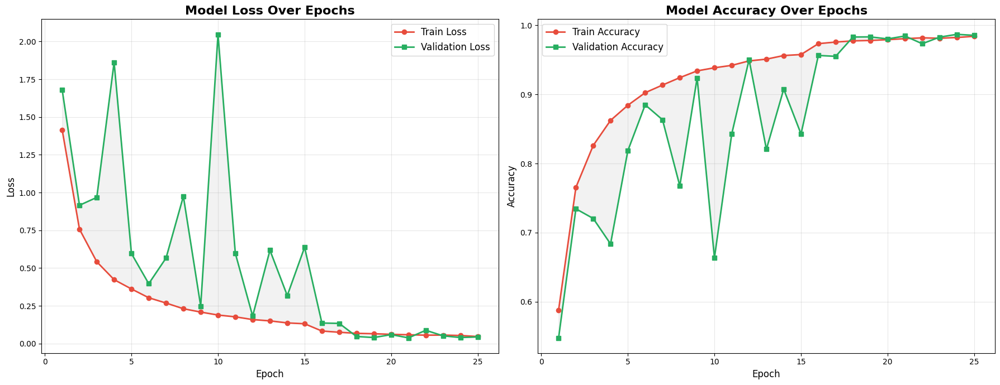

In [ ]:
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = np.arange(1, len(tr_acc) + 1)

plt.figure(figsize=(18, 7))

plt.subplot(1, 2, 1)
plt.plot(epochs, tr_loss, color='#E74C3C', linewidth=2, marker='o', label='Train Loss')
plt.plot(epochs, val_loss, color='#27AE60', linewidth=2, marker='s', label='Validation Loss')
plt.fill_between(epochs, val_loss, tr_loss, color='gray', alpha=0.1)
plt.title('Model Loss Over Epochs', fontsize=16, weight='bold')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.grid(alpha=0.3)
plt.legend(fontsize=12)

plt.subplot(1, 2, 2)
plt.plot(epochs, tr_acc, color='#E74C3C', linewidth=2, marker='o', label='Train Accuracy')
plt.plot(epochs, val_acc, color='#27AE60', linewidth=2, marker='s', label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs', fontsize=16, weight='bold')
plt.fill_between(epochs, val_acc, tr_acc, color='gray', alpha=0.1)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.grid(alpha=0.3)
plt.legend(fontsize=12)


plt.tight_layout()
plt.show()

170/170 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step


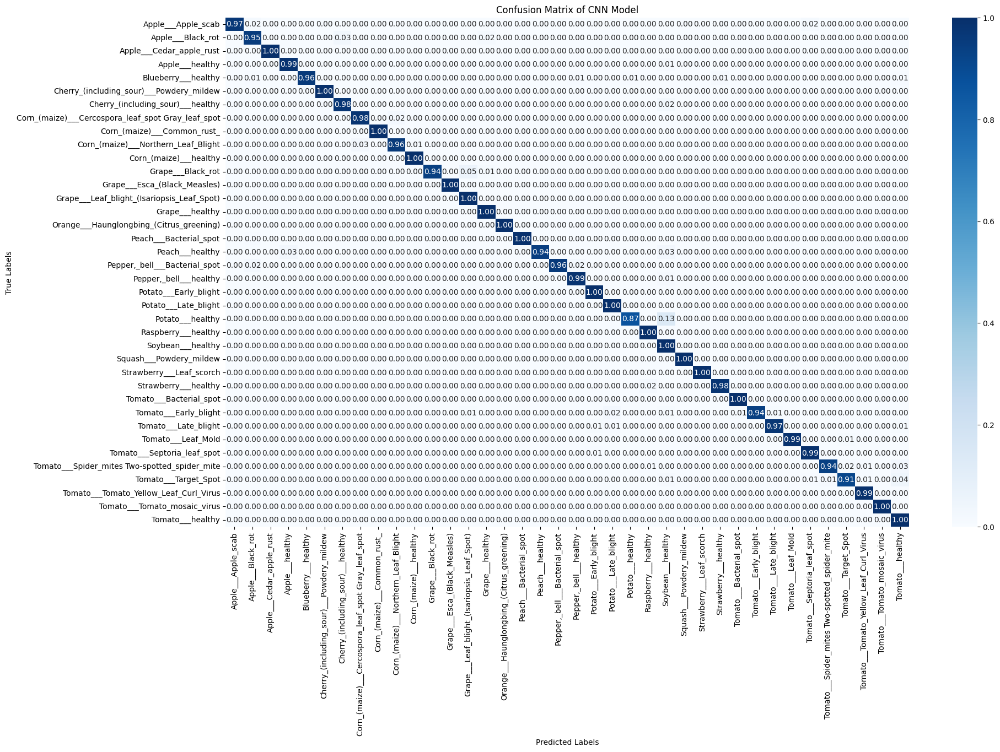


Classification Report:

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.97      0.98        63
                                 Apple___Black_rot       0.92      0.95      0.94        62
                          Apple___Cedar_apple_rust       1.00      1.00      1.00        27
                                   Apple___healthy       0.99      0.99      0.99       165
                               Blueberry___healthy       1.00      0.96      0.98       150
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00       105
                 Cherry_(including_sour)___healthy       0.98      0.98      0.98        85
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.94      0.98      0.96        51
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       120
               Corn_(maize)___Northern_Leaf_Blight    

In [ ]:
y_true = test_gen.classes

y_pred = model.predict(test_gen, verbose=1)
y_pred_classes = np.argmax(y_pred, axis=1)

cm = confusion_matrix(y_true, y_pred_classes,normalize='true')

class_names = list(test_gen.class_indices.keys())

plt.figure(figsize=(20, 12))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='.2f',
            xticklabels=class_names,
            yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix of CNN Model')
plt.show()

print("\nClassification Report:\n")
print(classification_report(y_true, y_pred_classes, target_names=class_names))

# Prediction

In [ ]:
def preprocess(img_path, target_size=(224, 224)):
    img = Image.open(img_path)
    resized = img.resize(target_size)
    img_array = np.array(resized)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array.astype('float32') / 255.
    return img_array

In [ ]:
def prediction(model,img_path,class_indices):
  preprocessed_img = preprocess(img_path)
  predictions = model.predict(preprocessed_img)
  predicted_class_index = np.argmax(predictions, axis=1)[0]
  predicted_class_name = class_indices[predicted_class_index]
  return predicted_class_name

In [ ]:
class_indices = {v: k for k, v in train_gen.class_indices.items()}
class_indices


{0: 'Apple___Apple_scab',
 1: 'Apple___Black_rot',
 2: 'Apple___Cedar_apple_rust',
 3: 'Apple___healthy',
 4: 'Blueberry___healthy',
 5: 'Cherry_(including_sour)___Powdery_mildew',
 6: 'Cherry_(including_sour)___healthy',
 7: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 8: 'Corn_(maize)___Common_rust_',
 9: 'Corn_(maize)___Northern_Leaf_Blight',
 10: 'Corn_(maize)___healthy',
 11: 'Grape___Black_rot',
 12: 'Grape___Esca_(Black_Measles)',
 13: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 14: 'Grape___healthy',
 15: 'Orange___Haunglongbing_(Citrus_greening)',
 16: 'Peach___Bacterial_spot',
 17: 'Peach___healthy',
 18: 'Pepper,_bell___Bacterial_spot',
 19: 'Pepper,_bell___healthy',
 20: 'Potato___Early_blight',
 21: 'Potato___Late_blight',
 22: 'Potato___healthy',
 23: 'Raspberry___healthy',
 24: 'Soybean___healthy',
 25: 'Squash___Powdery_mildew',
 26: 'Strawberry___Leaf_scorch',
 27: 'Strawberry___healthy',
 28: 'Tomato___Bacterial_spot',
 29: 'Tomato___Early_blight',
 30: '

In [ ]:
image_path = '/kaggle/input/plantvillage-dataset/color/Apple___Black_rot/0090d05d-d797-4c99-abd4-3b9cb323a5fd___JR_FrgE.S 8727.JPG'
predicted_class_name = prediction(model, image_path, class_indices)
print("Predicted Class Name:", predicted_class_name)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predicted Class Name: Apple___Black_rot


In [ ]:
image_path = '/kaggle/input/plantvillage-dataset/color/Blueberry___healthy/008c85d0-a954-4127-bd26-861dc8a1e6ff___RS_HL 2431.JPG'
predicted_class_name = prediction(model, image_path, class_indices)
print("Predicted Class Name:", predicted_class_name)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predicted Class Name: Blueberry___healthy


In [ ]:
image_path = '/kaggle/input/plantvillage-dataset/color/Potato___healthy/00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864.JPG'
predicted_class_name = prediction(model, image_path, class_indices)
print("Predicted Class Name:", predicted_class_name)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Predicted Class Name: Potato___healthy


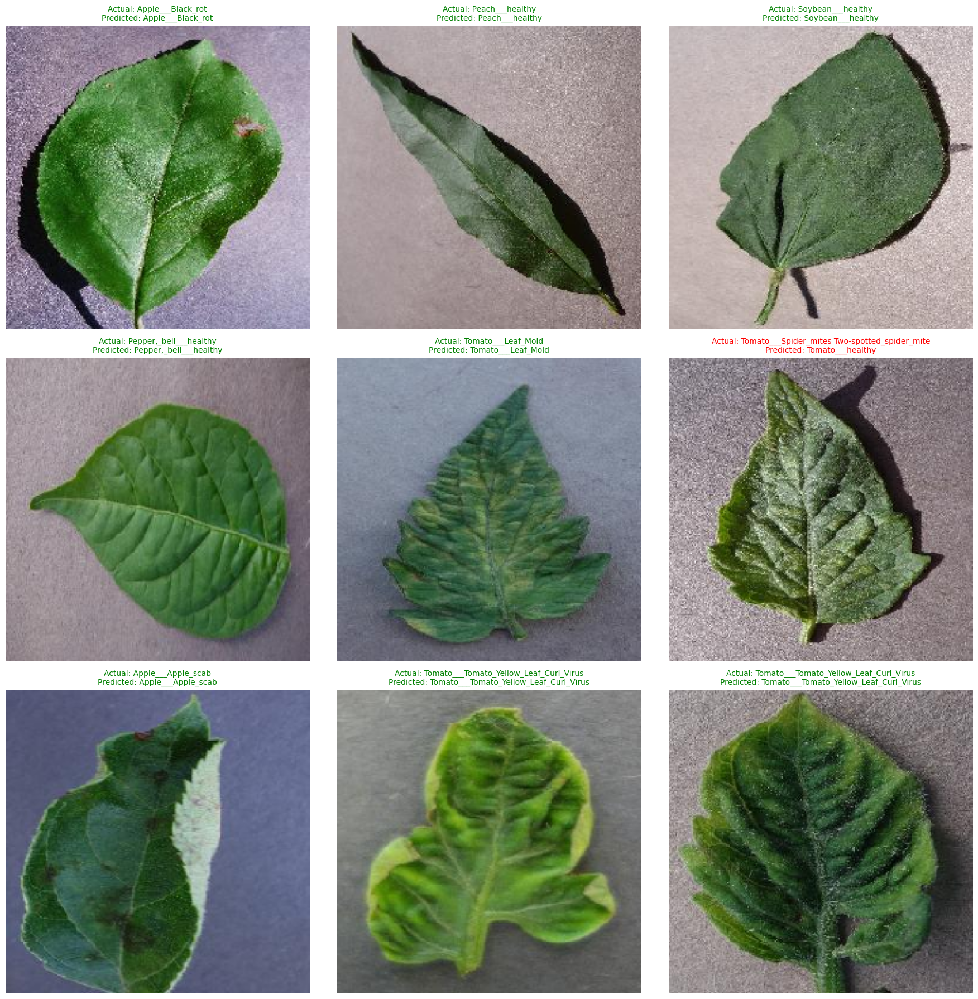

In [ ]:
plt.figure(figsize=(18,18))

images, labels = next(test_gen)

for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(images[i])
    plt.axis('off')

    true_label_idx = np.argmax(labels[i])
    actual = class_indices[true_label_idx]

    preds = model.predict(np.expand_dims(images[i], axis=0), verbose=0)
    pred_label_idx = np.argmax(preds)
    predict = class_indices[pred_label_idx]

    color = 'green' if actual == predict else 'red' #ternnary statement
    plt.title(f"Actual: {actual}\nPredicted: {predict}", color=color, fontsize=10)

plt.tight_layout()
plt.show()

# Transfer learning

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam


IMG_SHAPE = (224, 224, 3)
NUM_CLASSES = len(train_gen.class_indices)

print("--- Loading Transfer Learning Base Model (MobileNetV2) ---")

#2. Loading the pre-trained base model (with ImageNet weights)
base_model = MobileNetV2(input_shape=IMG_SHAPE,
                         include_top=False, # We are dropping the last classification layer
                         weights='imagenet')

# 3. Freeze the base model
# so that previously learned knowledge is not lost
base_model.trainable = False

#4. Creating a new model
model_tl = Sequential([
    base_model, # Pre-trained model
    GlobalAveragePooling2D(), # This is more effective than flattening.

    # Our custom classification head
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),

    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),

   # Output layer
    Dense(NUM_CLASSES, activation='softmax')
])

# 5. Compiling the model
model_tl.compile(optimizer=Adam(learning_rate=0.001),
                 loss='categorical_crossentropy',
                 metrics=['accuracy'])

model_tl.summary()

# 6. Callbacks - I will use the same ones as before, just give them different names.
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Changed the name of the checkpoint file so that it doesn't mix with the previous model
checkpoint_path_tl = "best_model_mobilenet.h5"

callbacks_tl = [
    EarlyStopping(patience=5, restore_best_weights=True, monitor='val_loss', verbose=1),
    ReduceLROnPlateau(factor=0.2, patience=3, monitor='val_loss', verbose=1),
    ModelCheckpoint(checkpoint_path_tl, monitor='val_loss', save_best_only=True, verbose=1)
]

# 7. Model training begins
print("\n--- Transfer Learning Model Training Starting ---")
history_tl = model_tl.fit(
    train_gen,
    epochs=25, # Transfer learning usually takes fewer Epochs
    validation_data=valid_gen,
    callbacks=callbacks_tl,
    verbose=1
)

--- Loading Transfer Learning Base Model (MobileNetV2) ---
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 38)             │         4,902 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,625,254 (10.01 MB)

 Trainable params: 366,502 (1.40 MB)

 Non-trainable params: 2,258,752 (8.62 MB)


--- Transfer Learning Model Training Starting ---
Epoch 1/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step - accuracy: 0.7200 - loss: 1.0211
Epoch 1: val_loss improved from inf to 0.28602, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 524s 378ms/step - accuracy: 0.7201 - loss: 1.0208 - val_accuracy: 0.9103 - val_loss: 0.2860 - learning_rate: 0.0010
Epoch 2/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step - accuracy: 0.8809 - loss: 0.3683
Epoch 2: val_loss improved from 0.28602 to 0.27191, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 490s 361ms/step - accuracy: 0.8809 - loss: 0.3683 - val_accuracy: 0.9133 - val_loss: 0.2719 - learning_rate: 0.0010
Epoch 3/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step - accuracy: 0.8967 - loss: 0.3200
Epoch 3: val_loss improved from 0.27191 to 0.24721, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 493s 363ms/step - accuracy: 0.8967 - loss: 0.3200 - val_accuracy: 0.9197 - val_loss: 0.2472 - learning_rate: 0.0010
Epoch 4/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step - accuracy: 0.9014 - loss: 0.3048
Epoch 4: val_loss improved from 0.24721 to 0.21486, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 500s 368ms/step - accuracy: 0.9014 - loss: 0.3048 - val_accuracy: 0.9302 - val_loss: 0.2149 - learning_rate: 0.0010
Epoch 5/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - accuracy: 0.9091 - loss: 0.2817
Epoch 5: val_loss improved from 0.21486 to 0.20092, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 533s 393ms/step - accuracy: 0.9091 - loss: 0.2817 - val_accuracy: 0.9343 - val_loss: 0.2009 - learning_rate: 0.0010
Epoch 6/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step - accuracy: 0.9124 - loss: 0.2603
Epoch 6: val_loss improved from 0.20092 to 0.19452, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 558s 411ms/step - accuracy: 0.9124 - loss: 0.2603 - val_accuracy: 0.9361 - val_loss: 0.1945 - learning_rate: 0.0010
Epoch 7/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step - accuracy: 0.9164 - loss: 0.2529
Epoch 7: val_loss improved from 0.19452 to 0.19141, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 541s 399ms/step - accuracy: 0.9164 - loss: 0.2529 - val_accuracy: 0.9350 - val_loss: 0.1914 - learning_rate: 0.0010
Epoch 8/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step - accuracy: 0.9187 - loss: 0.2452
Epoch 8: val_loss did not improve from 0.19141
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 508s 374ms/step - accuracy: 0.9187 - loss: 0.2452 - val_accuracy: 0.9346 - val_loss: 0.2004 - learning_rate: 0.0010
Epoch 9/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - accuracy: 0.9189 - loss: 0.2447
Epoch 9: val_loss did not improve from 0.19141
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 526s 387ms/step - accuracy: 0.9189 - loss: 0.2447 - val_accuracy: 0.9263 - val_loss: 0.2194 - learning_rate: 0.0010
Epoch 10/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step - accuracy: 0.9206 - loss: 0.2389
Epoch 10: val_loss improved from 0.19141 to 0.17499, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 512s 377ms/step - accuracy: 0.9206 - loss: 0.2389 - val_accuracy: 0.9409 - val_loss: 0.1750 - learning_rate: 0.0010
Epoch 11/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step - accuracy: 0.9254 - loss: 0.2238
Epoch 11: val_loss did not improve from 0.17499
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 501s 369ms/step - accuracy: 0.9254 - loss: 0.2238 - val_accuracy: 0.9405 - val_loss: 0.1797 - learning_rate: 0.0010
Epoch 12/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step - accuracy: 0.9253 - loss: 0.2217
Epoch 12: val_loss did not improve from 0.17499
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 497s 366ms/step - accuracy: 0.9253 - loss: 0.2217 - val_accuracy: 0.9372 - val_loss: 0.1826 - learning_rate: 0.0010
Epoch 13/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step - accuracy: 0.9307 - loss: 0.2109
Epoch 13: val_loss improved from 0.17499 to 0.17365, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 495s 365ms/step - accuracy: 0.9307 - loss: 0.2109 - val_accuracy: 0.9427 - val_loss: 0.1736 - learning_rate: 0.0010
Epoch 14/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step - accuracy: 0.9302 - loss: 0.2101
Epoch 14: val_loss did not improve from 0.17365
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 497s 366ms/step - accuracy: 0.9302 - loss: 0.2101 - val_accuracy: 0.9365 - val_loss: 0.1905 - learning_rate: 0.0010
Epoch 15/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step - accuracy: 0.9282 - loss: 0.2101
Epoch 15: val_loss improved from 0.17365 to 0.17076, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 483s 356ms/step - accuracy: 0.9282 - loss: 0.2101 - val_accuracy: 0.9424 - val_loss: 0.1708 - learning_rate: 0.0010
Epoch 16/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - accuracy: 0.9292 - loss: 0.2107
Epoch 16: val_loss did not improve from 0.17076
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 487s 359ms/step - accuracy: 0.9292 - loss: 0.2107 - val_accuracy: 0.9387 - val_loss: 0.1795 - learning_rate: 0.0010
Epoch 17/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step - accuracy: 0.9293 - loss: 0.2107
Epoch 17: val_loss did not improve from 0.17076
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 486s 358ms/step - accuracy: 0.9293 - loss: 0.2107 - val_accuracy: 0.9403 - val_loss: 0.1752 - learning_rate: 0.0010
Epoch 18/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step - accuracy: 0.9324 - loss: 0.2006
Epoch 18: val_loss improved from 0.17076 to 0.16435, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 495s 365ms/step - accuracy: 0.9324 - loss: 0.2006 - val_accuracy: 0.9457 - val_loss: 0.1643 - learning_rate: 0.0010
Epoch 19/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step - accuracy: 0.9357 - loss: 0.1944
Epoch 19: val_loss improved from 0.16435 to 0.16093, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 500s 368ms/step - accuracy: 0.9357 - loss: 0.1944 - val_accuracy: 0.9483 - val_loss: 0.1609 - learning_rate: 0.0010
Epoch 20/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step - accuracy: 0.9345 - loss: 0.1995
Epoch 20: val_loss did not improve from 0.16093
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 502s 370ms/step - accuracy: 0.9345 - loss: 0.1995 - val_accuracy: 0.9394 - val_loss: 0.1756 - learning_rate: 0.0010
Epoch 21/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - accuracy: 0.9354 - loss: 0.1932
Epoch 21: val_loss did not improve from 0.16093
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 490s 361ms/step - accuracy: 0.9354 - loss: 0.1932 - val_accuracy: 0.9418 - val_loss: 0.1672 - learning_rate: 0.0010
Epoch 22/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step - accuracy: 0.9340 - loss: 0.2002
Epoch 22: val_loss improved from 0.16093 to 0.15279, saving model to best_model_mobilenet.h5


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 505s 372ms/step - accuracy: 0.9340 - loss: 0.2002 - val_accuracy: 0.9479 - val_loss: 0.1528 - learning_rate: 0.0010
Epoch 23/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step - accuracy: 0.9324 - loss: 0.1987
Epoch 23: val_loss did not improve from 0.15279
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 511s 376ms/step - accuracy: 0.9324 - loss: 0.1987 - val_accuracy: 0.9479 - val_loss: 0.1552 - learning_rate: 0.0010
Epoch 24/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - accuracy: 0.9356 - loss: 0.1880
Epoch 24: val_loss did not improve from 0.15279
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 510s 376ms/step - accuracy: 0.9356 - loss: 0.1880 - val_accuracy: 0.9435 - val_loss: 0.1677 - learning_rate: 0.0010
Epoch 25/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - accuracy: 0.9363 - loss: 0.1896
Epoch 25: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.

Epoch 25: val_loss did not improve from 0.15279
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 509s 375ms/step - accuracy: 0.93

# Model Evaluation

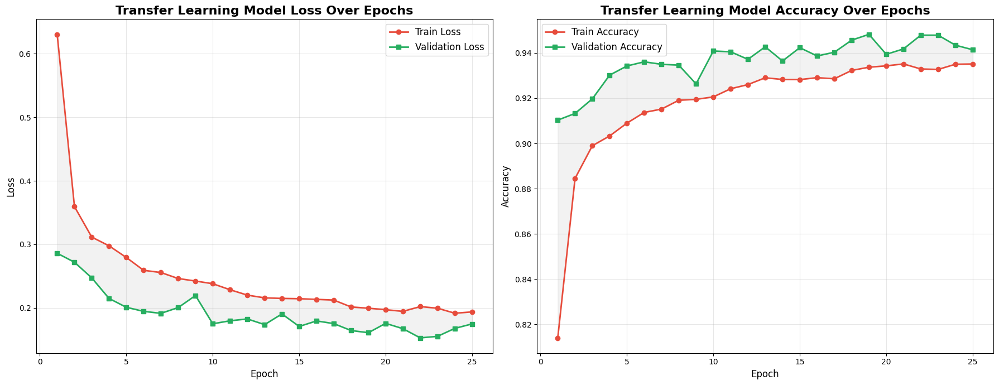

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# history_tl ভ্যারিয়েবল থেকে ডেটা নেওয়া হচ্ছে (নামটি ঠিক করা হলো)
tr_acc = history_tl.history['accuracy']
tr_loss = history_tl.history['loss']
val_acc = history_tl.history['val_accuracy']
val_loss = history_tl.history['val_loss']

# Epochs ইনডেক্স তৈরি করা
epochs = np.arange(1, len(tr_acc) + 1)

plt.figure(figsize=(18, 7))

# --- Plot 1: Model Loss Over Epochs ---
plt.subplot(1, 2, 1)
plt.plot(epochs, tr_loss, color='#E74C3C', linewidth=2, marker='o', label='Train Loss')
plt.plot(epochs, val_loss, color='#27AE60', linewidth=2, marker='s', label='Validation Loss')
plt.fill_between(epochs, val_loss, tr_loss, color='gray', alpha=0.1)
plt.title('Transfer Learning Model Loss Over Epochs', fontsize=16, weight='bold')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.grid(alpha=0.3)
plt.legend(fontsize=12)

# --- Plot 2: Model Accuracy Over Epochs ---
plt.subplot(1, 2, 2)
plt.plot(epochs, tr_acc, color='#E74C3C', linewidth=2, marker='o', label='Train Accuracy')
plt.plot(epochs, val_acc, color='#27AE60', linewidth=2, marker='s', label='Validation Accuracy')
plt.title('Transfer Learning Model Accuracy Over Epochs', fontsize=16, weight='bold')
plt.fill_between(epochs, val_acc, tr_acc, color='gray', alpha=0.1)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.grid(alpha=0.3)
plt.legend(fontsize=12)


plt.tight_layout()
plt.show()

170/170 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step


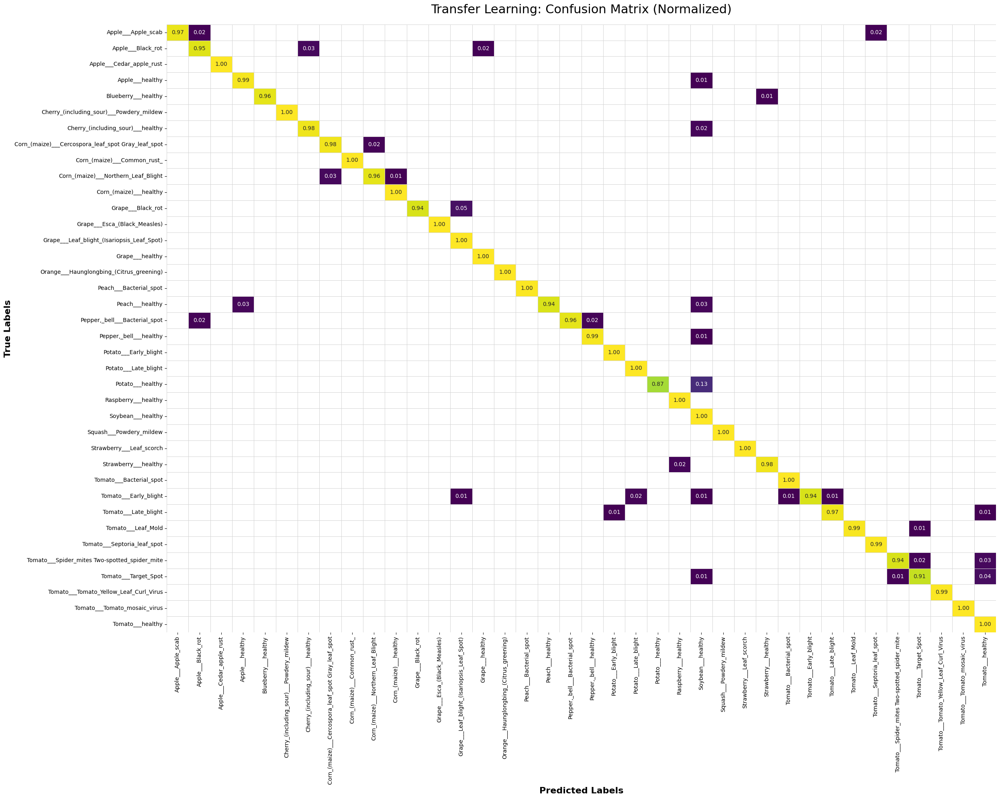


                             CLASSIFICATION REPORT                              

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.97      0.98        63
                                 Apple___Black_rot       0.92      0.95      0.94        62
                          Apple___Cedar_apple_rust       1.00      1.00      1.00        27
                                   Apple___healthy       0.99      0.99      0.99       165
                               Blueberry___healthy       1.00      0.96      0.98       150
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00       105
                 Cherry_(including_sour)___healthy       0.98      0.98      0.98        85
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.94      0.98      0.96        51
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# --- NOTE: The variables cm, class_names, y_true, y_pred_classes
# are assumed to be calculated from the prediction step just before this block.

# 1. Prepare for Prediction and CM Calculation (Essential Step)
# This code block must be run AFTER model.predict()
target_gen = test_gen
test_gen.reset() # Resetting the generator is crucial for order
y_pred = model.predict(target_gen, verbose=1)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = target_gen.classes
class_names = list(target_gen.class_indices.keys())

# 2. Calculate the Confusion Matrix (Normalized)
cm = confusion_matrix(y_true, y_pred_classes, normalize='true')

# 3. Plotting the Confusion Matrix (Static Seaborn - Optimized for 38 Classes)
plt.figure(figsize=(25, 20)) # Large figure size is needed for 38 classes

# Create a mask to hide very small values (< 0.01) to reduce visual clutter
mask = cm < 0.01

sns.heatmap(cm,
            annot=True,              # Display numbers in each cell
            cmap='viridis',          # Use a high-contrast color map
            fmt='.2f',               # Format numbers to 2 decimal places
            mask=mask,               # Hide cluttering 0.00 values
            xticklabels=class_names, # Use class names for X-axis labels
            yticklabels=class_names, # Use class names for Y-axis labels
            linewidths=0.5,          # Add lines between cells
            linecolor='lightgrey',
            cbar=False               # Remove the color bar for a cleaner look
           )

# 4. Final Plot Styling
plt.xlabel('Predicted Labels', fontsize=16, fontweight='bold')
plt.ylabel('True Labels', fontsize=16, fontweight='bold')
plt.title('Transfer Learning: Confusion Matrix (Normalized)', fontsize=22, pad=20)
plt.xticks(rotation=90, fontsize=10) # Rotate X-axis labels for readability
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()
plt.show()

# 5. Print Classification Report
report_string = classification_report(y_true, y_pred_classes, target_names=class_names, output_dict=False)

print("\n" + "="*80)
print("CLASSIFICATION REPORT".center(80))
print("="*80 + "\n")
print(report_string)

# Prediction

In [ ]:
from PIL import Image
import numpy as np

# 1. Creating the class index map (the most important step)
# train_gen.class_indices gives us {'Apple': 0, 'Banana': 1}
# For prediction we need {0: 'Apple', 1: 'Banana'}
class_map = {v: k for k, v in train_gen.class_indices.items()}

# 2. Preprocessing function
def preprocess(img_path, target_size=(224, 224)):
    # Loading images
    img = Image.open(img_path)

    # Resized (224x224 for MobileNetV2)
    resized = img.resize(target_size)

   # Convert to array
    img_array = np.array(resized)

    # Adding batch dimensions (1, 224, 224, 3)
    img_array = np.expand_dims(img_array, axis=0)

   # Normalization (since we used rescale=1./255 in training)
    img_array = img_array.astype('float32') / 255.

    return img_array

# 3. Prediction function
def prediction(model, img_path, class_map):
    try:
       # Preprocessing
        preprocessed_img = preprocess(img_path)

        # Predict
        predictions = model.predict(preprocessed_img)

       # Finding the index with the highest probability
        predicted_class_index = np.argmax(predictions, axis=1)[0]

       # Extracting names from maps
        predicted_class_name = class_map[predicted_class_index]

        # Confidence Score (optional, looks nice)
        confidence = np.max(predictions)

        return predicted_class_name, confidence

    except Exception as e:
        return f"Error: {e}", 0.0

# --- Testing ---

# Use 'model_tl' here if you named the transfer learning model model_tl
# or if you are loading a saved model, give that variable name.
current_model = model_tl # or just 'model'

# Picture 1: Apple Black Rot
image_path = '/kaggle/input/plantvillage-dataset/color/Apple___Black_rot/0090d05d-d797-4c99-abd4-3b9cb323a5fd___JR_FrgE.S 8727.JPG'
name, conf = prediction(current_model, image_path, class_map)
print(f"Actual: Apple___Black_rot | Predicted: {name} ({conf*100:.2f}%)")

# Picture 2: Blueberry Healthy
image_path = '/kaggle/input/plantvillage-dataset/color/Blueberry___healthy/008c85d0-a954-4127-bd26-861dc8a1e6ff___RS_HL 2431.JPG'
name, conf = prediction(current_model, image_path, class_map)
print(f"Actual: Blueberry___healthy | Predicted: {name} ({conf*100:.2f}%)")

# Picture 3: Potato Healthy
image_path = '/kaggle/input/plantvillage-dataset/color/Potato___healthy/00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864.JPG'
name, conf = prediction(current_model, image_path, class_map)
print(f"Actual: Potato___healthy  | Predicted: {name} ({conf*100:.2f}%)")

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Actual: Apple___Black_rot | Predicted: Apple___Black_rot (59.41%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Actual: Blueberry___healthy | Predicted: Blueberry___healthy (100.00%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Actual: Potato___healthy  | Predicted: Potato___healthy (99.77%)


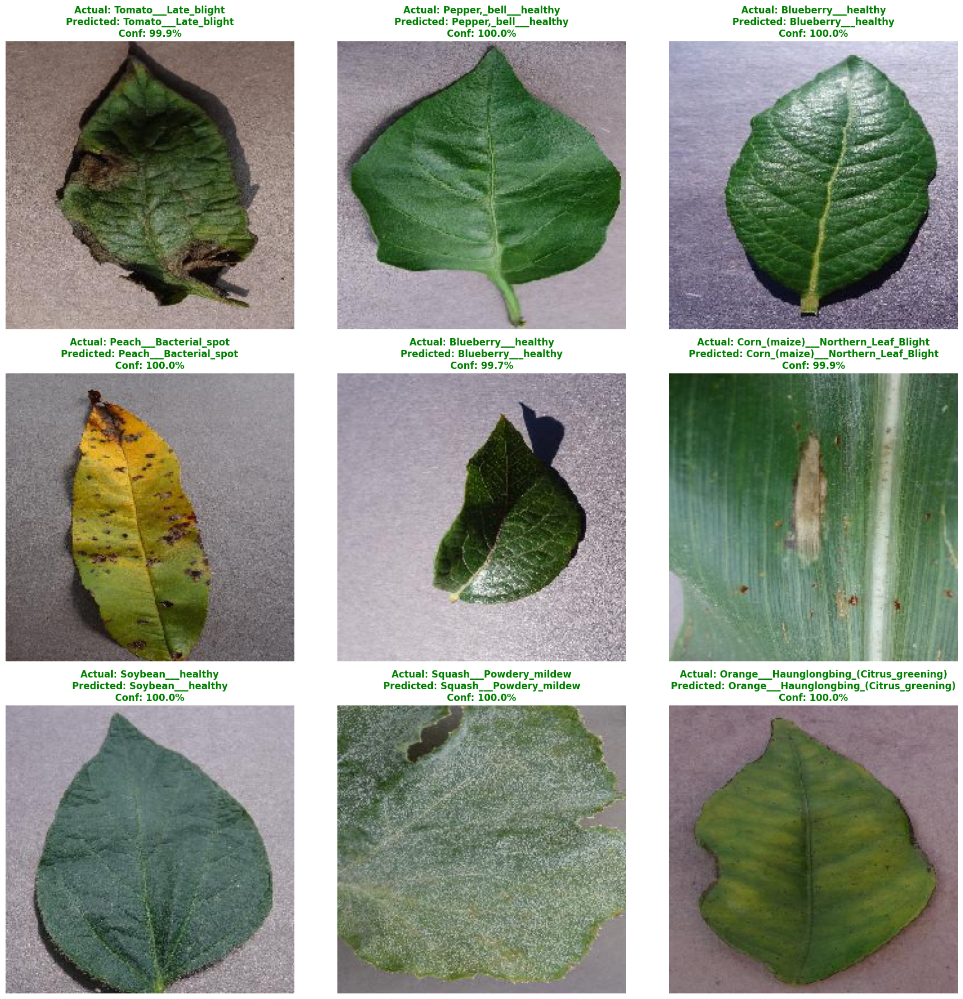

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 1. Create a map to get class names from indices
# train_gen.class_indices gives us {'Apple': 0, ...}
# We need {0: 'Apple', ...}
label_map = {v: k for k, v in train_gen.class_indices.items()}

# 2. Retrieving a batch of images from the test generator
# The next() function retrieves the next 32 images (or according to the batch size) from the generator
images, labels = next(test_gen)

# 3. Setting the plot size
plt.figure(figsize=(18, 18))

# 4. Loop the first 9 images
for i in range(9):
    plt.subplot(3, 3, i + 1)

    # Display images
    plt.imshow(images[i])
    plt.axis('off')

    # Finding the True Label
    true_label_idx = np.argmax(labels[i])
    actual = label_map[true_label_idx]

    # Making predictions
    # The model expects batches as input, so dimensions are expanded with expand_dims
    preds = model.predict(np.expand_dims(images[i], axis=0), verbose=0)
    pred_label_idx = np.argmax(preds)
    predict = label_map[pred_label_idx]

    # Confidence Score (optional)
    confidence = np.max(preds) * 100

    # Title is green if correct, red if incorrect
    color = 'green' if actual == predict else 'red'

    # Showing title
    plt.title(f"Actual: {actual}\nPredicted: {predict}\nConf: {confidence:.1f}%",
              color=color, fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()